# Setup

In [1]:
#@title Imports
%load_ext google.colab.data_table

import datetime as datetime
import json
import os
import hashlib
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import datetime as datetime
import dateutil.parser
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.lines as lines
from matplotlib.patches import Rectangle
import matplotlib.table as tab
import math
import numpy as np
import pandas as pd
import pytz
import pprint
import statistics
import sys
import unittest
import subprocess
from datetime import datetime
from datetime import time
from datetime import timedelta
from datetime import timezone
from google.colab import data_table
from google.colab import drive
from google.colab import output as co_out
# from google.colab import userdata

mpl.style.use('dark_background')
data_table._DEFAULT_FORMATTERS[float] = lambda x: f'{x:.2f}'
data_table._DEFAULT_FORMATTERS[np.float32] = lambda x: f'{x:.2f}'

local_colab = 'COLAB_RELEASE_TAG' not in os.environ.keys()
CACHE_DIR = os.path.join(os.environ['HOME'], 'Google Drive', 'My Drive', 'Glucose Prediction Work')
if not os.path.exists(CACHE_DIR):
  local_colab = False
  CACHE_DIR = '/content/drive/My Drive/Glucose Prediction Work'

print(CACHE_DIR)

/Users/robertbuessow/Google Drive/My Drive/Glucose Prediction Work


In [2]:
#@title Import Library from Github
![ -d gmagic ] || git clone https://github.com/buessow/gmagic.git
!cd gmagic; git pull origin
from gmagic.lib import LogNormAction as lna
from gmagic.lib.DateTimeInsulin import DateTimeInsulin, TimeInsulin
from gmagic.lib.Profile import Profile
from gmagic.lib.ProfileSwitch import ProfileSwitch
from gmagic.lib.TempBasal import TempBasal

Already up to date.


In [3]:
![[ $local_colab == False ]] && apt-get install openjdk-17-jre-headless -qq > /dev/null
if not local_colab: os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-17-openjdk-amd64"
![[ $local_colab == False ]] && update-alternatives --set java /usr/lib/jvm/java-17-openjdk-amd64/bin/java
!java -version

java version "17.0.7" 2023-04-18 LTS
Java(TM) SE Runtime Environment (build 17.0.7+8-LTS-224)
Java HotSpot(TM) 64-Bit Server VM (build 17.0.7+8-LTS-224, mixed mode, sharing)


In [4]:
#@title Model Class
class M(object):
  def __init__(self, name, **kwargs):
    self.name = name
    self.test_data = []
    self.use_conv = False
    for k, v in kwargs.items():
      setattr(self, k, v)
    self.prev_error = {}
m = M('default')

In [5]:
#@title Model Data

M.START = '2020-01-01'
M.END = '2023-12-31'
M.VALIDATION = '2023-10-01'

M.FREQ_MINUTES = 5
M.FREQ = timedelta(minutes=M.FREQ_MINUTES)

M.TRAIN_MINUTES = 120
M.PRED_MINUTES = 60
M.PERIOD_T = timedelta(minutes=M.TRAIN_MINUTES)
M.PERIOD_P = timedelta(minutes=M.PRED_MINUTES)
M.PERIOD = M.PERIOD_T + M.PERIOD_P

M.PERIOD_X_MINUTES = list(range(0, M.TRAIN_MINUTES, M.FREQ_MINUTES))
M.PERIOD_Y_MINUTES = list(range(M.TRAIN_MINUTES, M.TRAIN_MINUTES + M.PRED_MINUTES, M.FREQ_MINUTES))
M.PERIOD_MINUTES = M.PERIOD_X_MINUTES + M.PERIOD_Y_MINUTES

M.HR_HIGH_THRESHOLD = 120
M.HR_LONG_MINUTES = [24 * 60, 48 * 60]
M.HR_LONG_COLS = ['hr_long', 'hr_lon2']

@property
def validation_start(self):
  return pd.to_datetime(self.VALIDATION).tz_localize('UTC')
M.validation_start = validation_start
del validation_start

history = pd.DataFrame()
history_file = os.path.join(CACHE_DIR, 'run_history.csv')
if os.path.exists(history_file):
  history = pd.read_csv(history_file)

m.validation_start

Timestamp('2023-10-01 00:00:00+0000', tz='UTC')

mode 1.000000
mode 0.750000


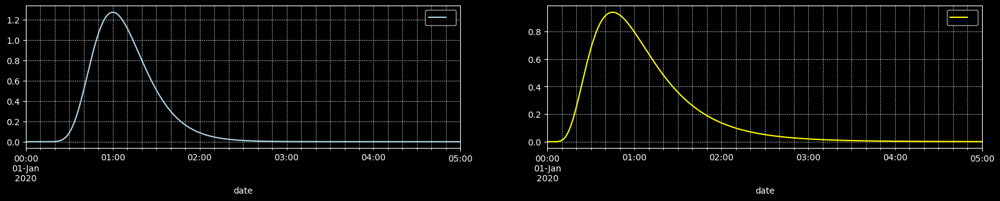

In [6]:
#@title Insulin and Carbohydrate Action
M.INSULIN_ACTION = lna.LogNormAction(mode=timedelta(minutes=60), sigma=0.3)
M.CARB_ACTION = lna.LogNormAction(mode=timedelta(minutes=45), sigma=0.50)

_, axs = plt.subplots(nrows=1, ncols=2, subplot_kw={}, figsize=(20,3))
M.INSULIN_ACTION.plot(timedelta(hours=5), color='lightblue', ax=axs[0])
M.CARB_ACTION.plot(timedelta(hours=5), color='yellow', ax=axs[1])

# print('mean %f' % M.INSULIN_ACTION.mean)

# Data Loading

In [7]:
def write_meta_json(self, file_name):
  meta = {
      'tensorflow_version': tf.__version__,
      'trainingPeriodMinutes': self.TRAIN_MINUTES,
      'predictionPeriodMinutes': self.PRED_MINUTES,
      'carbAction': {'mu': self.CARB_ACTION.mu, 'sigma': self.CARB_ACTION.sigma },
      'insulinAction': {'mu': self.INSULIN_ACTION.mu, 'sigma': self.INSULIN_ACTION.sigma },
      'hrHighThreshold': self.HR_HIGH_THRESHOLD,
      'hrLongDurationMinutes': self.HR_LONG_MINUTES,
      'testData': self.test_data,
      'freqMinutes': self.FREQ_MINUTES,
      'zoneId': 'CET',
  }
  with open(file_name, 'w') as f:
    json.dump(meta, f, indent=2)
  return meta
M.write_meta_json = write_meta_json
del write_meta_json

In [8]:
#@title Load Data

def load_data(self):
  meta_fname = '%s_load_meta.json' % self.name
  meta =  self.write_meta_json(meta_fname)
  hash = hashlib.sha1(str(meta).encode()).hexdigest()
  fname = 'input_%s_%s_%s.csv' % (self.START, self.END, hash)
  if not os.path.exists(fname):
    db = 'heroku_wxt9ng46'
    p = subprocess.run(args=[
        'java',
        '-jar', os.path.join(CACHE_DIR, 'glumagic-1.0.jar'),
        'api',
        '--configFile', meta_fname,
        '-from', self.START,
        '-to', self.END,
        '-db', db,
        '-k', 'l2G9aXCVJkqPI2uHDGJFdMSK1oM6x4chEZ9Ef3DEkz4fByczGqa6FCmMNaIVPblG', #userdata.get('mongoApiKey'),
        '-o', fname],
        capture_output=True, encoding='UTF-8',
        env={'JAVA_HOME': '/usr/lib/jvm/java-17-openjdk-amd64'})
    print('load data %d %s' % (p.returncode, p.stderr))

  self.glucose = pd.read_csv(fname)
  self.glucose.date = pd.to_datetime(self.glucose.date)
  self.glucose.set_index('date', inplace=True)
  self.glucose.rename({
    'glucoseSlope1': 'gl_slope',
    'glucoseSlope2': 'gl_slop2',
    'hrLong1': 'hr_long',
    'hrLong2': 'hr_lon2',
    'heartRate': 'heart_rate',
    'carbAction': 'ca',
    'insulinAction': 'ia'}, axis=1, errors='raise', inplace=True)
  self.glucose.glucose.fillna(method='ffill', limit=6, inplace=True)
  self.glucose.heart_rate.fillna(method='ffill', limit=3, inplace=True)
  self.glucose.heart_rate.fillna(value=60.0, inplace=True)
  self.glucose.dropna(inplace=True, subset=['glucose'])

  print('load data %s' % (str(self.glucose.shape)))

M.load_data = load_data
m.load_data()
m.glucose.describe()

load data 0 
load data (410302, 12)


/var/folders/98/yh978f1j4zq_ps8kx_9_wmy00000gn/T/ipykernel_3941/2588391854.py:35: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  self.glucose.glucose.fillna(method='ffill', limit=6, inplace=True)
/var/folders/98/yh978f1j4zq_ps8kx_9_wmy00000gn/T/ipykernel_3941/2588391854.py:36: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  self.glucose.heart_rate.fillna(method='ffill', limit=3, inplace=True)


,hour,glucose,gl_slope,gl_slop2,heart_rate,hr_long,hr_lon2,carbs,ca,bolus,basal,ia
count,410302.000000,410302.000000,408458.000000,4.079490e+05,410302.000000,410302.000000,410302.000000,410302.000000,410302.000000,410302.000000,410302.000000,410302.000000
mean,11.505320,121.366310,-0.002540,-7.479230e-07,63.035955,5.858921,11.708583,0.776772,9.286333,0.118423,0.036617,1.836683
std,6.905463,41.724008,1.128461,9.782260e-02,18.799487,10.953935,16.632623,6.996102,18.045188,0.562719,0.061475,1.760704
min,0.000000,0.000000,-17.800000,-1.981405e+00,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.041667,-0.111787
25%,6.000000,92.418060,-0.562876,-4.277603e-02,51.191291,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.691357
50%,12.000000,112.866220,-0.063449,1.103818e-03,60.000000,0.000000,4.000000,0.000000,0.408927,0.000000,0.009943,1.190998
75%,17.000000,143.040130,0.493315,4.394645e-02,66.200000,8.000000,17.000000,0.000000,9.865333,0.000000,0.056667,2.360768
max,23.000000,401.000000,12.754993,1.807152e+00,199.000000,80.000000,115.000000,240.000000,225.268770,20.200000,5.200000,22.242504


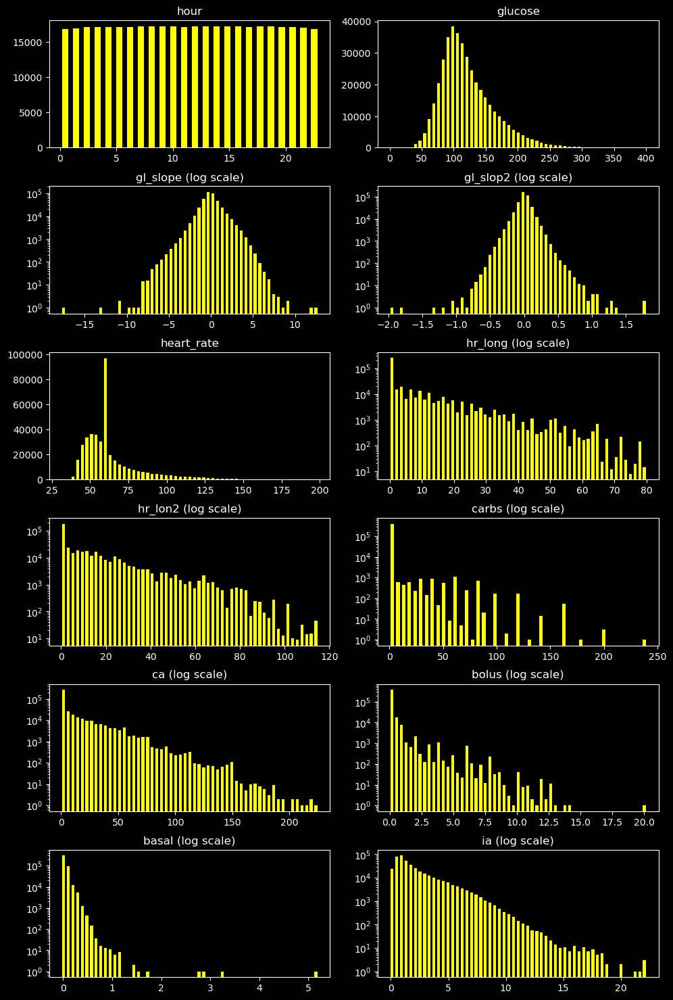

In [9]:
#@title Data Statistics

def statistics(self):
  self.glucose.describe()
  no_log_features = ['hour', 'glucose', 'gl_pred', 'heart_rate']

  fig, axs = plt.subplots(nrows=(len(self.glucose.columns)+1) // 2, ncols=2, figsize=(10, 15))
  fig.tight_layout(pad=2.0)
  axs = axs.flatten()
  for i, c in enumerate(self.glucose.columns):
    col = self.glucose[c]
    log = c not in no_log_features
    axs[i].hist(
        x=col.values, log=log, bins=min(col.nunique(), 55),
        label=c, rwidth=0.6, color='yellow')
    axs[i].set_title(c + (' (log scale)' if log else ''))

M.statistics=statistics
m.statistics()

In [10]:
# #@title Experimental Insulin Action

# import tensorflow_probability as tfp

# df = m.glucose.copy()
# df['minute15'] = df.index.map(lambda ts: ts.replace(minute=15 * (ts.minute // 15)))


# df - df.groupby(by=['minute15']).mean()



# td = timedelta(minutes=120)
# tdc = timedelta(minutes=60)

# window_th = 0.3

# bolus = df.bolus > 3

# # indexer = pd.api.indexers.FixedForwardWindowIndexer(window_size=td)
# window_bolus = (df
#       .bolus.map(lambda b: b if b > window_th else 0.0)
#       .rolling(window=tdc, center=False)
#       #.apply(lambda b: b[b > window_th]
#       .sum())
# window_carbs = (df
#       .carbs
#       .rolling(window=2*td, center=True)
#       #.apply(lambda b: b[b > window_th]
#       .sum())

# df['clean_bolus'] = (df.bolus == window_bolus) & bolus & (window_carbs < 0.1)

# ts = None
# gl = None
# points = []
# means = []
# modes = []
# for row in df.itertuples():
#   if row.clean_bolus:
#     ts = row.Index
#     gl = row.glucose
#     #print('Start %s bolus=%f' % (str(ts), row.bolus))
#   elif ts is not None and row.Index - ts < td:
#     minutes = int((row.Index-ts)/timedelta(minutes=1))
#     # print('Cont %s bolus=%f slope=%f' % (str(minutes), row.bolus, row.glucose))
#     points.append(row.glucose - gl)
#   elif len(points) > 0 and len(points) > 10:
#     ln = tfp.distributions.LogNormal.experimental_fit(points)
#     mean = ln.mean().numpy()
#     if not np.isnan(mean):
#       means.append(mean)
#       modes.append(ln.mode().numpy() / 12)
#       print('Mean: %f mode: %f' % (mean, ln.mode().numpy() / 4))
#     points = []
#   else:
#     points = []

# pd.Series(modes).median()

# # print('ln %f %f' % (ln.loc, ln.scale))

In [11]:
# ln = tfp.distributions.LogNormal.experimental_fit([1., 2., 1.])

# print(ln)


# print(ln.mean().numpy())
# print(ln.variance().numpy())



# data = ln.sample(10)
# ln1 = tfp.distributions.LogNormal(1, 1)
# data=ln1.sample(100)

# x = np.linspace(0, 10, 100, dtype=np.float64)
# plt.scatter(x=x, y=ln.prob(x), color='red', alpha=0.4)

# # ln1.log_prob([1,2])
# ln1.prob(x)

# Setup and Train Model

In [12]:
def value_col_name(n, m):
  if n == 'glucose': n = 'gl'
  elif n == 'gl_slope': n = 'gls'
  elif n == 'gl_slop2': n = 'gls2'
  elif n == 'heart_rate': n = 'hr'
  return '%s_%03d' % (n, m)
def gl_col_name(m): return value_col_name('glucose', m)
def gl_slope_col_name(m): return value_col_name('gl_slope', m)
def ia_col_name(m): return value_col_name('ia', m)
def ca_col_name(m): return value_col_name('ca', m)

In [13]:
df = pd.DataFrame({'a': [1, 2], 'b': [3 ,4], 'c' : [5, 6]})
df = df.set_index(['a', 'b'])

df.reset_index('a')

dict(x=3)

{'x': 3}

In [14]:
#@title Pivot Input
def datetime_to_period(self, dt):
  day = dt.floor('D')
  t = dt - day
  return day + self.PERIOD * (t // self.PERIOD)
M.datetime_to_period = datetime_to_period

M.xy_cols = ['gl_slope', 'gl_slop2']
M.x_cols = ['ia', 'ca', 'hr']
M.x_min_cols = M.xy_cols + M.x_cols
M.feature_min_cols = ['glucose', 'heart_rate', 'gl_slope', 'gl_slop2', 'ia', 'ca']
M.feature_cols = M.feature_min_cols + M.HR_LONG_COLS
M.all_cols = ['hour'] + M.feature_min_cols

def pivot_for_model(self, gl=None):
  df = (self.glucose if gl is None else gl).copy()
  df['minute'] = df.index.map(
      lambda dt: self.FREQ_MINUTES * ((dt - self.datetime_to_period(dt)) // self.FREQ))
  df.index = df.index.map(self.datetime_to_period)
  df.reset_index(inplace=True)

  # Aggregate values, usually we get a single value. Compute the mean if there
  # are multiple.
  def agg(x):
    return float(x if pd.api.types.is_scalar(x) else sum(x) / len(x))
  df = pd.pivot_table(
      df, index=['date'], columns='minute',
      values=self.feature_cols + ['hour'],
      aggfunc=dict(hour=min, **{v: agg for v in self.feature_cols}))
  # Lift the sub-columns up, e.g. rename df['glucose'][5] to df['glucose_005']
  r = pd.concat({
       'hour': df['hour'][self.PERIOD_MINUTES[-1]],
       **{hr_long: df[hr_long][self.PERIOD_MINUTES[-1]] for hr_long in self.HR_LONG_COLS},
       **{value_col_name(v, m): df[v][m] for v in self.feature_min_cols for m in self.PERIOD_MINUTES}},
      axis=1).dropna()
  if gl is None: self.input = r
  return r
M.pivot_for_model = pivot_for_model
del pivot_for_model

def order_cols(df, cols, fill):
  o = df.copy()
  if fill is None:
    cols = [c for c in cols if c in df.columns]
  else:
    for c in cols:
      if c not in df.columns:
        o[c] = fill
  return o[cols].copy()

def order_cols_fm(self, df, min_cols):
  cols = [value_col_name(c, m) for c in min_cols for m in self.PERIOD_MINUTES]
  return order_cols(df, ['hour'] + cols + self.HR_LONG_COLS, fill=0.0)
M.order_cols_fm = order_cols_fm
del order_cols_fm

def order_cols_mf(self, df, min_cols):
  min_cols = [value_col_name(c, m)  for m in self.PERIOD_MINUTES for c in min_cols]
  return order_cols(df, ['hour'] + min_cols + self.HR_LONG_COLS, fill=0.0)
M.order_cols_mf = order_cols_mf
del order_cols_mf

def pivot_input(self):
  i1 = self.pivot_for_model(self.glucose)
  #i2 = self.pivot_for_model(self.glucose[12:])
  self.input = pd.concat([i1])
M.pivot_input = pivot_input
del pivot_input

m.pivot_input()
print('input shape %s' % str(m.input.shape))
data_table.DataTable(m.input.head(2000), max_columns=100)

/var/folders/98/yh978f1j4zq_ps8kx_9_wmy00000gn/T/ipykernel_3941/299503571.py:26: FutureWarning: The provided callable <built-in function min> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  df = pd.pivot_table(


input shape (11085, 219)


,hour,hr_long,hr_lon2,gl_000,gl_005,gl_010,gl_015,gl_020,gl_025,gl_030,gl_035,gl_040,gl_045,gl_050,gl_055,gl_060,gl_065,gl_070,gl_075,gl_080,gl_085,gl_090,gl_095,gl_100,gl_105,gl_110,gl_115,gl_120,gl_125,gl_130,gl_135,gl_140,gl_145,gl_150,gl_155,gl_160,gl_165,gl_170,gl_175,hr_000,...,ia_160,ia_165,ia_170,ia_175,ca_000,ca_005,ca_010,ca_015,ca_020,ca_025,ca_030,ca_035,ca_040,ca_045,ca_050,ca_055,ca_060,ca_065,ca_070,ca_075,ca_080,ca_085,ca_090,ca_095,ca_100,ca_105,ca_110,ca_115,ca_120,ca_125,ca_130,ca_135,ca_140,ca_145,ca_150,ca_155,ca_160,ca_165,ca_170,ca_175
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-01 06:00:00+00:00,9.0,0.0,0.0,76.324420,74.535120,71.291390,76.401340,84.525085,84.474915,81.356900,80.067116,75.64883,79.02676,88.133330,92.667786,98.210700,101.000000,97.798660,91.254180,85.859535,73.866670,63.404682,60.932884,60.000000,61.063545,62.000000,67.849495,73.000000,73.000000,75.658860,80.65886,83.531770,81.872910,77.872910,75.468230,77.127090,72.618730,70.190636,75.12709,60.00,...,1.267079,1.183029,1.107743,1.037238,2.429899,5.607904,11.313346,17.830038,24.129112,30.018616,34.920826,38.171803,39.512897,39.109142,36.988323,34.384180,31.274162,27.969833,24.690600,21.577349,18.710760,16.128600,13.839883,11.835578,10.09623,8.597173,7.311927,6.214302,5.279631,4.485393,3.811480,3.240207,2.756204e+00,2.346223,1.998919,1.704624,1.455127,1.243478,1.063800,0.911133
2020-01-01 09:00:00+00:00,12.0,0.0,0.0,80.722404,85.063545,89.190636,94.127090,98.127090,97.341140,93.936455,94.595314,98.12709,99.46823,99.000000,102.722404,103.872910,97.214050,89.809364,81.150505,73.894040,72.521736,76.130430,83.695656,91.652176,101.260870,100.739130,91.347824,85.391304,86.130430,87.434784,92.30303,101.170570,105.056854,101.244150,96.471570,95.471570,95.000000,95.528430,94.41472,60.00,...,1.063196,1.196767,1.409807,1.650871,0.781297,0.670767,0.576572,0.496212,0.427577,0.368888,0.318646,0.275583,0.238630,0.206882,0.081581,0.070732,0.061398,0.053360,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2020-01-01 12:00:00+00:00,15.0,0.0,0.0,93.528430,95.056854,95.471570,94.471570,92.420000,92.580536,95.585280,97.528430,98.00000,98.52843,96.886284,93.943146,92.471570,91.471570,91.000000,90.471570,89.471570,89.000000,88.471570,89.056854,91.585280,96.170570,98.471570,93.772575,88.943146,88.000000,88.000000,88.52843,87.414720,84.943146,85.585280,88.585280,88.943146,88.528430,90.585280,86.71572,60.00,...,1.993648,1.965521,1.909357,1.847115,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2020-01-01 15:00:00+00:00,18.0,0.0,0.0,80.414720,80.585280,83.623290,89.414720,97.966550,104.759200,109.759200,115.862880,118.44816,120.20736,126.966550,133.207350,136.103680,137.551830,139.607150,148.328860,155.000000,158.698990,164.113710,166.000000,163.886290,158.301010,151.829440,147.943150,147.000000,145.949830,142.899660,137.83893,131.829440,129.000000,127.419464,127.056854,128.528430,130.585280,132.000000,129.35786,60.00,...,8.527097,7.854574,7.173090,6.522304,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2020-01-01 18:00:00+00:00,21.0,0.0,0.0,124.357860,121.471570,119.943146,114.686005,102.772575,92.160540,86.806020,83.354515,82.00000,82.00000,80.949830,77.899666,73.899666,68.849495,63.899666,68.826090,77.625420,81.05017

In [15]:
#@title Split Training, Prediction, and Validation Data

@property
def train(self, df=None):
  if df is None: df = self.input
  return df[df.index < self.validation_start]
M.train = train
del train

@property
def validation(self, df=None):
  if df is None: df = self.input
  return df[df.index >= self.validation_start]
M.validation = validation
del validation

def x_data_dense(self, df):
  return df.reset_index().filter(
    ['hour'] + self.HR_LONG_COLS +
    [value_col_name(v, m) for v in self.xy_cols for m in self.PERIOD_X_MINUTES] +
    [value_col_name(v, m) for v in self.x_cols for m in self.PERIOD_MINUTES])
M.x_data_dense = x_data_dense
del x_data_dense

def x_data_conv(self, df):
  df = df.reset_index().filter(
    ['hour']  +
    [value_col_name(v, m) for v in self.x_min_cols for m in self.PERIOD_MINUTES] +
    self.HR_LONG_COLS).copy()
  for c in self.xy_cols:
    for m in self.PERIOD_Y_MINUTES:
      df[value_col_name(c, m)] = 0 # df[ca_col_name(m)] - df[ia_col_name(m)]
  return df
M.x_data_conv = x_data_conv
del x_data_conv

def x_data(self, df):
  if self.use_conv:
    return self.x_data_conv(df)
  else:
    return self.x_data_dense(df)
M.x_data = x_data
del x_data

def y_data(self, df):
  return df.reset_index().filter([gl_slope_col_name(m) for m in self.PERIOD_Y_MINUTES])
M.y_data = y_data
del y_data

m.x_data_conv(m.train).columns.tolist()

['hour',
 'gls_000',
 'gls_005',
 'gls_010',
 'gls_015',
 'gls_020',
 'gls_025',
 'gls_030',
 'gls_035',
 'gls_040',
 'gls_045',
 'gls_050',
 'gls_055',
 'gls_060',
 'gls_065',
 'gls_070',
 'gls_075',
 'gls_080',
 'gls_085',
 'gls_090',
 'gls_095',
 'gls_100',
 'gls_105',
 'gls_110',
 'gls_115',
 'gls_120',
 'gls_125',
 'gls_130',
 'gls_135',
 'gls_140',
 'gls_145',
 'gls_150',
 'gls_155',
 'gls_160',
 'gls_165',
 'gls_170',
 'gls_175',
 'gls2_000',
 'gls2_005',
 'gls2_010',
 'gls2_015',
 'gls2_020',
 'gls2_025',
 'gls2_030',
 'gls2_035',
 'gls2_040',
 'gls2_045',
 'gls2_050',
 'gls2_055',
 'gls2_060',
 'gls2_065',
 'gls2_070',
 'gls2_075',
 'gls2_080',
 'gls2_085',
 'gls2_090',
 'gls2_095',
 'gls2_100',
 'gls2_105',
 'gls2_110',
 'gls2_115',
 'gls2_120',
 'gls2_125',
 'gls2_130',
 'gls2_135',
 'gls2_140',
 'gls2_145',
 'gls2_150',
 'gls2_155',
 'gls2_160',
 'gls2_165',
 'gls2_170',
 'gls2_175',
 'ia_000',
 'ia_005',
 'ia_010',
 'ia_015',
 'ia_020',
 'ia_025',
 'ia_030',
 'ia_035',
 'i

<Axes: >

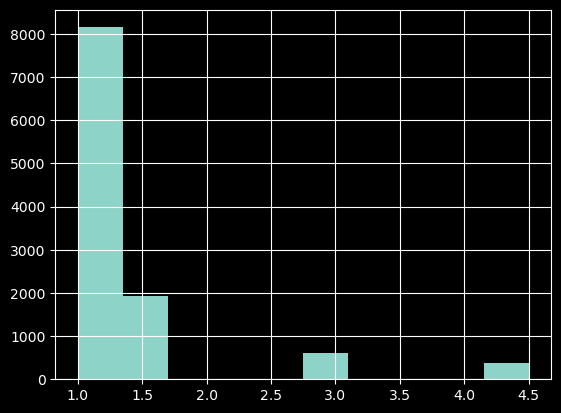

In [16]:
#@title Sample Weights

M.low_glucose = 70
M.high_glucose = 150
M.turn_slope_th = 1
M.low_weight = 3
M.turn_weight = 1.5

@property
def last_glucose_col(self):
  return gl_col_name(self.PERIOD_X_MINUTES[-1])
M.last_glucose_col = last_glucose_col

@property
def y_glucose_cols(self):
  return list(map(gl_col_name, self.PERIOD_Y_MINUTES))
M.y_glucose_cols = y_glucose_cols

@property
def gl_slope_cols(self):
  return list(map(gl_slope_col_name, self.PERIOD_Y_MINUTES))
M.gl_slope_cols = gl_slope_cols

def compute_sample_weight(self):
  def m(y):
    predict_low = (
        y[self.y_glucose_cols].min() < self.low_glucose and
        y[self.last_glucose_col] > self.low_glucose)
    predict_turn = (
        y[self.gl_slope_cols].min() < -self.turn_slope_th and
        y[self.gl_slope_cols].max() > self.turn_slope_th)
    weight = self.low_weight if predict_low else 1
    weight = weight * (self.turn_weight if predict_turn else 1)
    return weight
  self.input['sample_weight'] = self.input.apply(m, axis=1)
M.compute_sample_weight = compute_sample_weight
m.compute_sample_weight()

m.input.sample_weight.hist()

In [17]:
#@title Predict Values

def predict(self, features, add_glucose=False):
  pred_arrays = self.model.predict(self.x_data(features), verbose=0).transpose()
  prediction = pd.DataFrame(index=features.index)
  for i, m in enumerate(self.PERIOD_Y_MINUTES):
    prediction[gl_slope_col_name(m)] = pred_arrays[i]

  if (add_glucose):
    last_glucose_col = gl_col_name(self.PERIOD_X_MINUTES[-1])
    prediction[last_glucose_col] = features[last_glucose_col]
    freq = self.FREQ_MINUTES
    for m in self.PERIOD_Y_MINUTES:
      prediction[gl_col_name(m)] = (
          freq * prediction[gl_slope_col_name(m)] + prediction[gl_col_name(m - freq)])
  return prediction
M.predict = predict

In [18]:
#@title Metrics Logging
def minutes_to_label(self, minutes):
  return minutes + self.TRAIN_MINUTES - self.FREQ_MINUTES
M._minutes_to_label = minutes_to_label

M.tf_writer = None
def log_accuracy(self, epoch, logs):
  if epoch % 5 != 0: return
  data = self.validation
  p = self.predict(data, True)
  with self.tf_writer.as_default():
    for minutes in (30, 60):
      col = gl_slope_col_name(self._minutes_to_label(minutes))
      err = (data[col] - p[col]).abs().mean()
      tf.summary.scalar('slope accuracy %d min' % minutes, err, step=epoch)
      self.metrics.setdefault('sl_acc_%d' % minutes, []).append(err)

      col = gl_col_name(self._minutes_to_label(minutes))
      gerr = (data[col] - p[col]).abs().mean()
      tf.summary.scalar('glucose accuracy %d min' % minutes, gerr, step=epoch)
      self.metrics.setdefault('gl_acc_%d' % minutes, []).append(gerr)
      grerr = 100 * ((data[col] - p[col]) / data[col]).abs().mean()
      tf.summary.scalar('glucose accuracy %% %d min' % minutes, grerr, step=epoch)
      self.metrics.setdefault('gl_acc%%_%d' % minutes, []).append(grerr)
M._log_accuracy = log_accuracy

In [19]:
#@title Model Helpers

def layer_short_name(l):
  if isinstance(l, tf.keras.layers.Normalization):
    return 'N'
  elif isinstance(l, tf.keras.layers.Dense):
    return 'D(%d)' % l.units
  elif isinstance(l, tf.keras.layers.Conv1D):
    return 'Conv(%d,%s)' % (l.filters, l.kernel_size)
  elif isinstance(l, tf.keras.layers.Conv1DTranspose):
    return 'ConvT(%d,%s)' % (l.filters, l.kernel_size)
  elif isinstance(l, tf.keras.layers.ConvLSTM1D):
    return 'ConvL(%d,%s)' % (l.filters, l.kernel_size)
  elif isinstance(l, tf.keras.layers.Dropout):
    return 'Drop(%.2f)' % l.rate
  else:
    return l.name[:2]

def concat_layers(n, input, layers, o):
  o.append('[')
  sep = ''
  out = []
  for l in layers:
    o.append(sep)
    out.append(seq_layers(n, input, l, o))
    sep = '|'
  o.append(']')
  return tf.keras.layers.concatenate(out)

def seq_layers(n, input, layers, o):
  c = input
  layers = layers if isinstance(layers, list) else [layers]
  for l in layers:
    if isinstance(l, list):
      c = concat_layers(n + '  ', c, l, o)
    else:
      o.append(layer_short_name(l))
      c = l(c)
      # print('%s%s %s' % (n, l.name, getattr(c, 'shape', '-')))
  return c


2024-02-06 15:10:56.019995: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


model: InN[ReCrRePeConv(5,(36,))ReD(100)|D(100)]D(12)


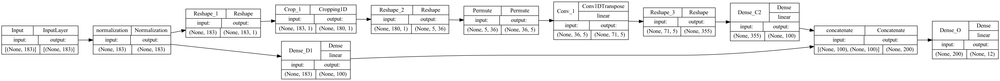

In [20]:
#@title Create Convolution Model


def create_model_conv(self):
  x = self.x_data_conv(self.train)
  normalizer = tf.keras.layers.Normalization()
  normalizer.adapt(x)

  min_feature_cnt = len(self.x_min_cols)
  min_cnt = len(self.PERIOD_MINUTES)

  conv1_size = 5
  layers = [
    normalizer,
    [
      [ # Remove hour and hr_long* features.
        tf.keras.layers.Reshape((x.shape[1],1), name='Reshape_1'),
        tf.keras.layers.Cropping1D(cropping=(1, 2), name='Crop_1'),
        # Put all values with the same timestamp in one sub-vector.
        tf.keras.layers.Reshape((5, len(self.PERIOD_MINUTES)), name='Reshape_2'),
        tf.keras.layers.Permute((2, 1), name='Permute'),
        tf.keras.layers.Conv1DTranspose(
        # tf.keras.layers.ConvLSTM1D(
            name='Conv_1',
            filters=conv1_size,
            kernel_size=min_cnt,
            input_shape=(None, 1, min_cnt, min_feature_cnt)),
        tf.keras.layers.Reshape(((2 * min_cnt -1) * conv1_size,), name='Reshape_3'),
        tf.keras.layers.Dense(name='Dense_C2', units=100),
      ],
      [ tf.keras.layers.Dense(100, name='Dense_D1') ],
    ],
    tf.keras.layers.Dense(self.y_data(self.train).shape[1], name='Dense_O'),
  ]

  input_layer = tf.keras.layers.Input(shape=x.shape[1:], name='Input')
  o = [layer_short_name(input_layer)]
  l = seq_layers('', input_layer, layers, o)
  return ''.join(o), keras.Model(inputs=[input_layer], outputs=[l])

M.create_model_conv = create_model_conv
del create_model_conv

def create_model_dense(self):
  normalizer = tf.keras.layers.Normalization()
  normalizer.adapt(self.x_data(self.input))
  return tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(self.x_data(self.train).shape[1],)),
    normalizer,
    tf.keras.layers.Dropout(rate=0.1),
    tf.keras.layers.Dense(units=400),
    tf.keras.layers.Dropout(rate=0.1),
    tf.keras.layers.Dense(units=self.y_data(self.train).shape[1])])
M.create_model_dense = create_model_dense
del create_model_dense

def create_model(self):
  if self.use_conv:
    return self.create_model_conv()
  else:
    return self.create_model_dense()
M.create_model = create_model
del create_model

mn, model = m.create_model_conv()
print('model: %s' % mn)
tf.keras.utils.plot_model(
    model,
    rankdir='LR',  # remove for larger image
    show_shapes=True,
    show_layer_activations=True)

In [21]:
%%time
#@title Train Model

M.epochs = 100
M.batch_size = 32
M.validation_split = 0.2

M.log_base = os.path.join(CACHE_DIR, 'fitlogs')
M.use_conv = True

M.optimizer_args = {'learning_rate': 0.0005, 'beta_1': 0.999}
M.optimizer_mnemonic = 'lAdam'
M.optimizer = tf.keras.optimizers.legacy.Adam
M.loss_args = {'delta': 0.5}
M.loss_mnemonic = 'H'
M.loss = tf.keras.losses.Huber

def error_at(self, f, m):
  col = value_col_name(f, m + self.TRAIN_MINUTES - self.FREQ_MINUTES)
  return self.prediction[col] - self.validation[col]
M.error_at = error_at
del error_at

def train_model(self):
  print("train model '%s'" % self.name)
  self.compute_sample_weight()
  mnemonic, self.model = self.create_model()
  self.model.compile(
    optimizer=self.optimizer(**self.optimizer_args),
    metrics=['mse', 'mae', keras.metrics.LogCoshError(name="logcosh", dtype=None)],
    weighted_metrics=['mse'],
    loss=self.loss(**self.loss_args))

  self.metrics = {}
  log_dir = self.log_base + '/' + datetime.now().strftime("%Y-%m-%dT%H:%M")
  self.tf_writer = tf.summary.create_file_writer(log_dir)

  t = self.train #.sample(frac=1)

  self.history = self.model.fit(
      self.x_data(t),
      self.y_data(t),
      epochs=self.epochs,
      batch_size=self.batch_size,
      sample_weight=self.train.sample_weight.fillna(1.0).values,
      validation_split=self.validation_split,
      use_multiprocessing=True,
      callbacks=[
          tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1),
          keras.callbacks.LambdaCallback(on_epoch_end=self._log_accuracy)],
      verbose=0)
  self.metrics.update(self.history.history)
  with self.tf_writer.as_default():
    tf.summary.flush()
  self.tf_writer.close()
  self.tf_writer = None

  history_row = {
      'time': [pd.Timestamp.now()],
      'model': [mnemonic],
      'epochs': self.epochs,
      'batch_size': self.batch_size,
      'train': self.TRAIN_MINUTES,
      'loss': '%s(%s)' % (self.loss_mnemonic, str(self.loss_args)[1:-1]),
      'optimizer': '%s(%s)' % (self.optimizer_mnemonic, str(self.optimizer_args)[1:-1]),
      'start': self.START,
      'end': self.END,
      'features': ', '.join(self.all_cols)
  }
  self.prediction = self.predict(self.validation, True)
  for f in ['gls', 'glucose']:
    for m in [30, 60]:
      e = self.error_at(f, m).abs().mean()
      k = '%s mae %d'% (f, m)
      history_row[k] = [e]
  global history
  history = pd.concat([pd.DataFrame(history_row), history], ignore_index=True)

M.train_model = train_model
del train_model
m.use_conv = True
m.train_model()

history.to_csv(history_file, index=False)
history

train model 'default'
CPU times: user 50.2 s, sys: 14.1 s, total: 1min 4s
Wall time: 37 s


,time,model,epochs,batch_size,train,loss,optimizer,start,end,features,gls mae 30,gls mae 60,glucose mae 30,glucose mae 60
0,2024-02-06 15:11:33.333137,"InN[ReCrRePeConv(5,(36,))ReD(100)|D(100)]D(12)",100,32,120,H('delta': 0.5),"lAdam('learning_rate': 0.0005, 'beta_1': 0.999)",2020-01-01,2023-12-31,"hour, glucose, heart_rate, gl_slope, gl_slop2,...",0.681249,0.775722,10.701288,22.754083
1,2024-02-06 10:15:25.001808,"InN[ReCrRePeConv(5,(36,))ReD(100)|D(100)]D(12)",100,32,120,H('delta': 0.5),"lAdam('learning_rate': 0.0005, 'beta_1': 0.999)",2020-01-01,2023-12-31,"hour, glucose, heart_rate, gl_slope, gl_slop2,...",0.682883,0.768681,10.676910,22.155947
2,2024-02-06 09:56:59.700044,"InN[ReCrRePeConv(5,(36,))ReD(100)|D(100)]D(12)",100,32,120,H('delta': 0.5),"lAdam('learning_rate': 0.0005, 'beta_1': 0.999)",2020-01-01,2023-12-31,"hour, glucose, heart_rate, gl_slope, gl_slop2,...",0.682243,0.771611,10.496134,22.164848
3,2024-02-06 09:44:33.162658,"InN[ReCrRePeConv(5,(36,))ReD(100)|D(100)]D(12)",100,32,120,H('delta': 0.5),"lAdam('learning_rate': 0.0005, 'beta_1': 0.999)",2020-01-01,2023-12-31,"hour, glucose, heart_rate, gl_slope, gl_slop2,...",0.687791,0.770904,10.599054,22.353425
4,2024-02-06 09:35:14.217576,"InN[ReCrRePeConv(5,(36,))ReD(100)|D(100)]D(12)",100,32,120,H('delta': 0.5),"lAdam('learning_rate': 0.0005, 'beta_1': 0.999)",2020-01-01,2023-12-31,"hour, glucose, heart_rate, gl_slope, gl_slop2,...",0.684185,0.778326,10.592141,22.449056
5,2024-02-06 09:32:48.913659,"InN[ReCrRePeCrConv(5,(24,))ReD(100)|D(100)]D(12)",100,32,120,H('delta': 0.5),"lAdam('learning_rate': 0.0005, 'beta_1': 0.999)",2020-01-01,2023-12-31,"hour, glucose, heart_rate, gl_slope, gl_slop2,...",0.722119,0.777204,11.215320,23.359086
6,2024-02-05 22:42:57.575346,"InN[ReCrRePeConv(5,(36,))ReD(100)|D(100)]D(12)",100,32,120,H('delta': 0.5),"lAdam('learning_rate': 0.0005, 'beta_1': 0.999)",2020-01-01,2023-12-31,"hour, glucose, heart_rate, gl_slope, gl_slop2,...",0.691387,0.769381,10.566381,22.380433
7,2024-02-05 22:35:54.819989,"InN[ReCrRePeConv(5,(36,))ReD(100)|D(100)]D(12)",100,32,120,H('delta': 0.5),"lAdam('learning_rate': 0.0005, 'beta_1': 0.999)",2021-01-01,2023-12-31,"hour, glucose, heart_rate, gl_slope, gl_slop2,...",0.696427,0.772306,10.660980,22.534818
8,2024-02-05 22:34:03.632093,"InN[ReCrRePeConv(5,(36,))ReD(100)|D(100)]D(12)",100,32,120,H('delta': 0.5),"lAdam('learning_rate': 0.0005, 'beta_1': 0.999)",2021-01-01,2023-12-31,"hour, glucose, heart_rate, gl_slope, gl_slop2,...",0.696579,0.779935,10.855391,22.986063
9,2024-02-05 22:29:31.705840,"InN[ReCrRePeConv(5,(36,))ReD(100)|D(100)]D(12)",100,32,120,H('delta': 0.5),"lAdam('learning_rate': 0.0005, 'beta_1': 0.999...",2021-01-01,2023-12-31,"hour, glucose, heart_rate, gl_slope, gl_slop2,...",0.704872,0.770036,10.718701,22.855814


# Model Evaluation

> Indented block



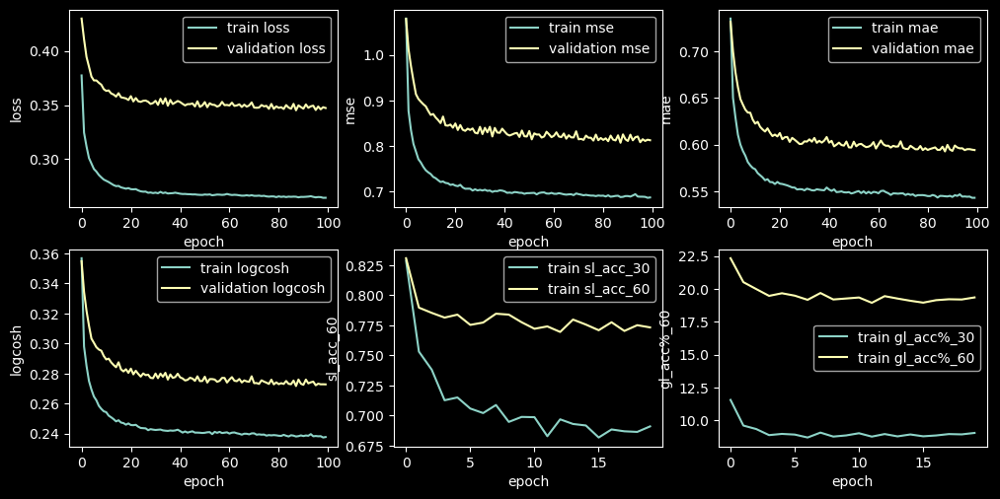

In [22]:
#@title Loss and Metrics

def plot_loss(self, ax, metric):
  ax.plot(self.metrics[metric], label='train ' + metric)
  if 'val_' + metric in self.metrics.keys():
    ax.plot(self.metrics['val_' + metric], label='validation ' + metric)
  ax.set_xlabel('epoch')
  ax.set_ylabel(metric)
  ax.legend()
  ax.grid(False)
M.plot_loss = plot_loss

def plot_metrics(self):
  vmetrics = ['loss', 'mse', 'mae', 'logcosh']
  pmetrics = ['sl_acc', 'gl_acc%']
  c = len(vmetrics) + len(pmetrics)
  ncols = 3
  fig, axs = plt.subplots(ncols=ncols, nrows=(c+ncols-1)//ncols, subplot_kw={}, figsize=(10,5))
  axs = axs.flatten()
  fig.tight_layout(pad=1.0)
  for i, m in enumerate(vmetrics): self.plot_loss(axs[i], m)
  for i, m in enumerate(pmetrics):
    self.plot_loss(axs[i+len(vmetrics)], m + '_30')
    self.plot_loss(axs[i+len(vmetrics)], m + '_60')
M.plot_metrics = plot_metrics
del plot_metrics
m.plot_metrics()



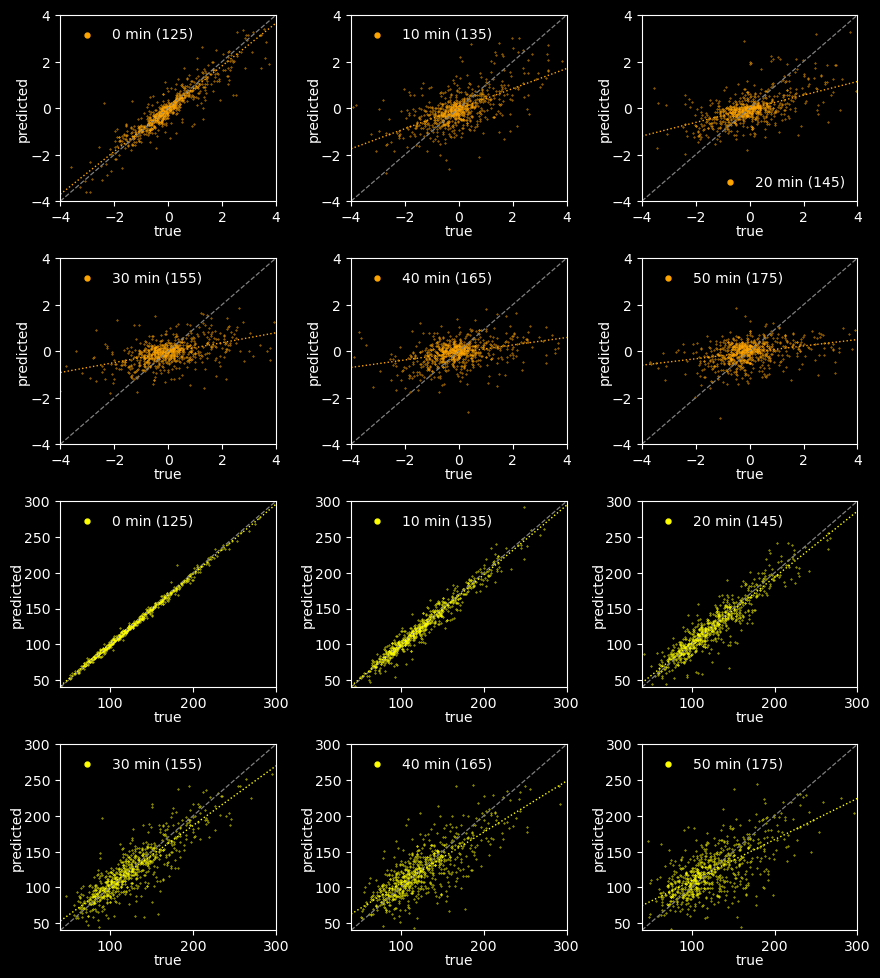

In [23]:
# @title True vs. Predicted Value Plots

def plot_linear_regression(ax, x_series, y_series, color, range):
  length = x_series.shape[0]
  p = np.polyfit(x_series.values, y_series.values, deg=1)
  x_ext = np.linspace(range[0], range[1], length)
  y_ext = np.poly1d(p)(x_ext)
  ax.plot(x_ext, y_ext, color=color, linewidth=1, linestyle='dotted')

def tp_scatter(self, ax, name, pred, true, color, range, minutes):
  m = minutes - self.TRAIN_MINUTES - self.FREQ_MINUTES
  ax.scatter(true[name], pred[name], s=0.5, marker='.', color=color, label='%d min (%d)' % (m, minutes))
  ax.set_xlabel('true', labelpad=0)
  ax.set_ylabel('predicted', labelpad=0)
  ax.set_xlim(range[0], range[1])
  ax.set_ylim(range[0], range[1])
  ax.set_xmargin(20)
  ax.set_label([name])
  ax.legend(markerscale=10, frameon=False)
  ax.plot([0, 1], [0, 1], transform=ax.transAxes, color='grey', linestyle='--', linewidth=0.9)
  plot_linear_regression(ax, true[name], pred[name], color, range)
M._tp_scatter = tp_scatter


def true_pred_plots(self):
  fig, axs = plt.subplots(nrows=4, ncols=3, subplot_kw={}, figsize=(9,10))
  fig.tight_layout(pad=2.0)
  for i, m in enumerate([m for m in self.PERIOD_Y_MINUTES[1::2]]):
    self._tp_scatter(axs[i//3][i%3], gl_slope_col_name(m), self.prediction, self.validation, color='orange', range=(-4, 4), minutes=m)
  for i, m in enumerate(self.PERIOD_Y_MINUTES[1::2]):
    self._tp_scatter(axs[2 + i//3][i%3], gl_col_name(m), self.prediction, self.validation, color='yellow', range=(40, 300), minutes=m)

M.true_pred_plots = true_pred_plots
m.true_pred_plots()

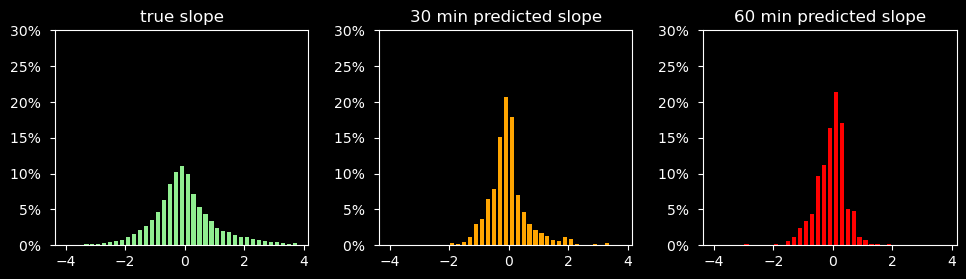

In [24]:
#@title True vs. Predicted Values Histogram
import matplotlib.colors as colors

def frange(f, t, s=1):
  def gen(f, t, s):
    while f < t:
      yield f
      f = round(f + s, 8)
  return list(gen(f, t, s))

def tp_histo(self):
  def hist(ax, x, color, title):
    ax.hist(x=x, bins=frange(-4, 4, 0.2), rwidth=0.7,
            color=color, weights=np.ones(len(x)) / len(x))
    ax.set_title(title)
    ax.set_ylim(0, 0.3)
    ax.yaxis.set_major_formatter(lambda y, _: '%d%% ' % int(100*y))
  fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(10, 3))
  fig.tight_layout(pad=2.0)
  axs = axs.flatten()
  hist(axs[0],
       x=self.glucose[(self.glucose.index >= self.validation_start)].gl_slope,
       color='lightgreen', title='true slope')
  hist(axs[1], x=self.prediction[gl_slope_col_name(self.TRAIN_MINUTES + 25)],
       color='orange', title='30 min predicted slope')
  hist(axs[2], x=self.prediction[gl_slope_col_name(self.TRAIN_MINUTES + 55)],
       color='red', title='60 min predicted slope')

M.tp_histo = tp_histo
del tp_histo
m.tp_histo()

mean absolute error: 0.6
mean absolute error perc: 73.3


,e 10%-ile,e 50%-ile,e 75%-ile,e 90%-ile,e 99%-ile,e% 10%-ile,e% 50%-ile,e% 75%-ile,e% 90%-ile,e% 99%-ile,mean_abs_error,mean_abs_error_p
gls_120,0.006249,0.031451,0.058283,0.093190,0.163915,0.834525,5.325986,12.386414,36.169130,115.476535,0.042374,13.580216
gls_125,0.022659,0.182116,0.349738,0.660792,1.645439,4.994283,26.818751,54.528342,102.398630,185.496752,0.283987,41.451802
gls_130,0.060159,0.367042,0.772016,1.310613,2.746503,13.094053,54.728445,96.685770,145.100721,191.296091,0.563632,67.087248
gls_135,0.074413,0.439820,0.887799,1.388188,2.991599,17.781333,66.754556,107.183731,147.812241,193.432901,0.643530,76.364313
gls_140,0.064925,0.414215,0.884862,1.447232,3.322964,18.418025,70.119054,109.130693,146.978463,191.951719,0.636789,77.428155
gls_145,0.070244,0.477259,0.922062,1.432555,3.518967,19.631767,75.727893,108.340170,143.923149,193.036930,0.681249,79.098143
gls_150,0.089989,0.488647,0.958617,1.548484,3.447585,24.116776,81.471475,111.068136,154.733267,191.032309,0.704212,83.983107
gls_155,0.065613,0.479034,0.973538,1.579192,3.431588,23.749665,79.273506,113.781848,150.467768,193.895516,0.709877,83.436434
gls_160,0.081839,0.500543,0.985525,1.585175,3.342662,24.651451,81.666865,118.643373,146.440169,187.884190,0.726450,85.146033
gls_165,0.085694,0.530728,1.042948,1.704082,3.730439,25.606394,88.769665,122.929542,156.605166,191.526548,0.766577,89.965061


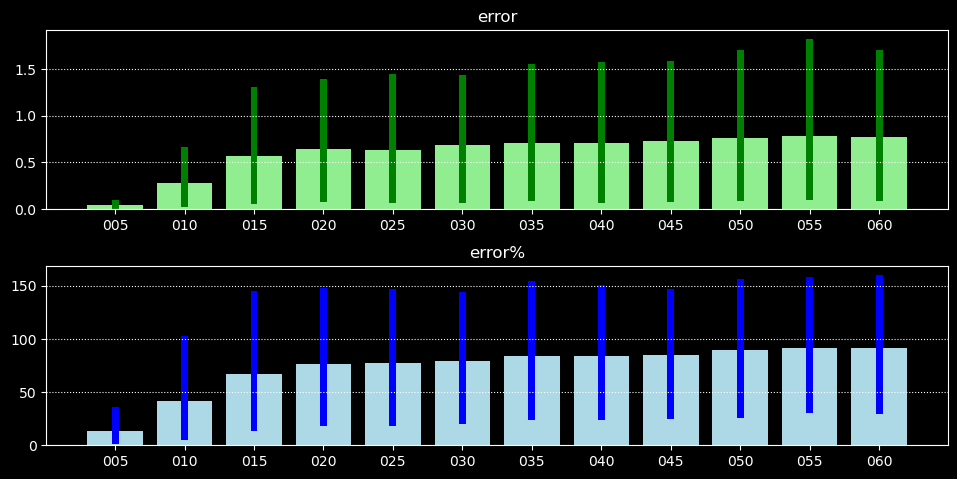

In [25]:
#@title Slope Mean Error and Error Quantiles

def print_errors(true, pred):
  abs_error = (pred - true).abs()
  mean_abs_error = abs_error.sum().sum() / pred.size
  mean_abs_errors = abs_error.sum() / pred.shape[0]

  maxv = pred.abs().where(pred.abs() > true.abs(), true.abs())
  abs_error_p = (100 * (pred - true)/maxv).abs()
  mean_abs_errors_p = abs_error_p.sum() / pred.shape[0]

  print("mean absolute error: %.01f" % mean_abs_error)
  print("mean absolute error perc: %.01f" % mean_abs_errors_p.mean())

  bar_labels = ['%03d' % m for m in range(5, 65, 5)]
  fig, axs = plt.subplots(nrows=2, subplot_kw={}, figsize=(10,5))
  fig.tight_layout(pad=2.0)

  ax = axs[0]
  ax.set_title("error")
  ax.bar(bar_labels, mean_abs_errors.values, color='lightgreen')
  ax.bar(bar_labels,
        (abs_error.quantile(q=0.9)-abs_error.quantile(q=0.1)).values,
        bottom=abs_error.quantile(q=0.1).values, width=0.1, color='green')
  ax.grid(True, which='major', axis='y', ls=':')
  ax = axs[1]
  ax.set_title("error%")
  ax.bar(bar_labels, mean_abs_errors_p.values, color='lightblue')
  ax.bar(bar_labels,
        (abs_error_p.quantile(q=0.9)-abs_error_p.quantile(q=0.1)).values,
        bottom=abs_error_p.quantile(q=0.1).values, width=0.1, color='blue')
  ax.grid(True, which='major', axis='y', ls=':')

  cols = {'%s %.0f%%-ile' % (n, 100 * q): ae.quantile(q=q) for n, ae in [('e', abs_error), ('e%', abs_error_p)] for q in [0.1, 0.5, 0.75, 0.9, 0.99]}
  cols['mean_abs_error'] = mean_abs_errors
  cols['mean_abs_error_p'] = mean_abs_errors_p
  return pd.DataFrame(cols)

def print_slope_errors(self):
  return print_errors(
      self.y_data(self.validation),
      self.prediction.reset_index().filter([gl_slope_col_name(m) for m in self.PERIOD_Y_MINUTES]))
M.print_slope_errors = print_slope_errors

data_table.DataTable(m.print_slope_errors())

mean absolute error: 11.6
mean absolute error perc: 8.6


,e 10%-ile,e 50%-ile,e 75%-ile,e 90%-ile,e 99%-ile,e% 10%-ile,e% 50%-ile,e% 75%-ile,e% 90%-ile,e% 99%-ile,mean_abs_error,mean_abs_error_p
gl_120,0.148232,1.025780,2.057874,3.586215,8.534746,0.113352,0.859467,1.729746,3.181752,7.006000,1.618028,1.341244
gl_125,0.201745,1.417628,2.711324,4.614517,9.796300,0.169252,1.133802,2.249461,3.646460,8.595327,2.059480,1.680410
gl_130,0.383952,2.249518,4.682710,8.554476,18.320556,0.309695,1.823932,3.875271,6.532265,14.003779,3.603784,2.873047
gl_135,0.670133,4.226401,8.143870,14.087953,28.168324,0.573051,3.382091,6.288151,11.465555,21.879002,6.104230,4.832696
gl_140,1.019426,5.993726,11.370988,19.264106,37.195367,0.780805,4.918454,9.045447,14.601581,31.811495,8.403549,6.584994
gl_145,1.316767,7.447988,14.515713,23.387999,47.891986,1.131283,6.090978,11.909781,16.545290,39.485470,10.701288,8.233188
gl_150,1.664474,8.935430,17.312663,27.658007,57.006477,1.263582,7.203764,13.370160,20.261152,43.288644,12.749947,9.656886
gl_155,1.829150,10.597738,20.445932,33.298148,65.088008,1.672971,8.387675,15.193588,24.064833,43.009250,14.733983,10.920911
gl_160,2.294032,11.716509,23.181288,38.972885,67.550079,2.020321,9.624846,17.562493,25.856863,42.584011,16.762771,12.218518
gl_165,2.391527,13.267577,26.014193,42.861481,74.904441,2.165403,10.194037,20.158950,28.688508,45.761412,18.705791,13.478896


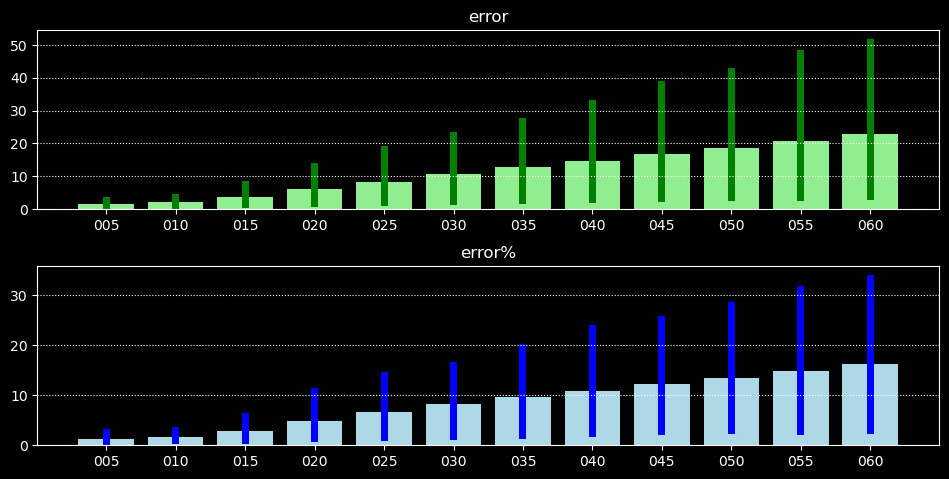

In [26]:
#@title Glucose Mean Error and Error Quantiles
def print_glucose_errors(self):
  return print_errors(
      self.validation.reset_index().filter([gl_col_name(m) for m in self.PERIOD_Y_MINUTES]),
      self.prediction.reset_index().filter([gl_col_name(m) for m in self.PERIOD_Y_MINUTES]))
M.print_glucose_errors = print_glucose_errors

data_table.DataTable(m.print_glucose_errors(), num_rows_per_page=100)

# Scenarios

In [27]:
#@title Timeline Date

start_date = '2022-10-29' # @param{type: 'date'}
days = 3 # @param{type:'slider', min: 0, max: 30}
tt = timedelta(days=days)
start = pd.to_datetime(start_date)

In [28]:
#@title Add Prediction to Input

def add_prediction(self, gl=None):
  input, glucose = (self.input, self.glucose) \
      if gl is None else (self.pivot_for_model(gl), gl)

  p = self.predict(input, add_glucose=True)
  p = p.filter([value_col_name(c, m)
      for c in ['gls', 'gl']
      for m in self.PERIOD_Y_MINUTES]).reset_index()
  p = pd.wide_to_long(p, stubnames=['gls_', 'gl_'], i='date', j='minute')
  p = p.reset_index()
  p['date'] = p.apply(lambda r: r.date + timedelta(minutes=r.minute), axis=1)
  p.pop('minute')
  p.rename({'gls_': 'gl_slope', 'gl_': 'glucose'}, inplace=True, axis=1)
  p.sort_values(by='date', inplace=True)
  p.set_index('date', inplace=True)
  glucose['gl_pred'] = p['glucose']
  return p

M.add_prediction = add_prediction
del add_prediction
m.add_prediction()

data_table.DataTable(m.glucose.head(2000))

,hour,glucose,gl_slope,gl_slop2,heart_rate,hr_long,hr_lon2,carbs,ca,bolus,basal,ia,gl_pred
date,,,,,,,,,,,,,
2020-01-01 00:55:00+00:00,1,0.00000,NaN,NaN,60.0,0.0,0.0,0.0,0.0,0.0,0.053333,0.690383,NaN
2020-01-01 01:00:00+00:00,2,0.00000,0.000000,NaN,60.0,0.0,0.0,0.0,0.0,0.0,0.053333,0.669133,NaN
2020-01-01 01:05:00+00:00,2,0.00000,0.000000,NaN,60.0,0.0,0.0,0.0,0.0,0.0,0.053333,0.654150,NaN
2020-01-01 01:10:00+00:00,2,0.00000,NaN,NaN,60.0,0.0,0.0,0.0,0.0,0.0,0.053333,0.616277,NaN
2020-01-01 01:15:00+00:00,2,0.00000,NaN,NaN,60.0,0.0,0.0,0.0,0.0,0.0,0.053333,0.612563,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-01-08 00:50:00+00:00,1,42.46154,-0.214642,0.056877,60.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.814831,NaN
2020-01-08 00:55:00+00:00,1,42.53691,-0.046154,0.020726,60.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.705665,NaN
2020-01-08 01:00:00+00:00,2,42.00000,-0.007382,0.028562,60.0,0.0,0.0,0.0,0.0,0.0,0.031467,0.625103,NaN


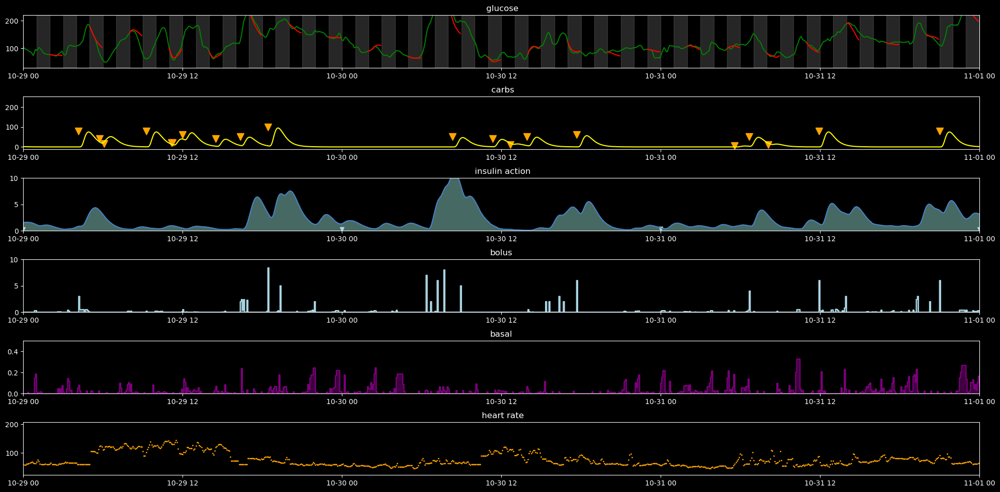

In [29]:
#@title History Timeline

date_range = start, start + tt

def plot_timeline(axs, gl, title=None, date_range=None, glucose_range=(30, 220)):
  carbs = gl[gl.carbs > 0]
  bolus =gl[gl.bolus > 0].reset_index()
  axs[0].set_ylim(glucose_range[0], glucose_range[1])
  axs[2].set_ylim(0, 10)
  date_range = date_range or (gl.index.min(), gl.index.max())
  for ax in axs: ax.set_xlim(date_range)
  axs[0].plot_date(gl.index, gl['glucose'], linestyle='-', markersize=0, color='green')
  axs[0].plot_date(gl.index, gl['gl_pred'], linestyle='-', markersize=0, color='red')
  for dt in pd.date_range(start=date_range[0], end=date_range[1], freq=timedelta(hours=2)):
    s = mdates.date2num(dt + timedelta(hours=1))
    e = mdates.date2num(dt + timedelta(hours=2))
    r = Rectangle((s, glucose_range[0]), e-s, glucose_range[1], color='grey', alpha=0.3)
    axs[0].add_patch(r)
  axs[1].plot_date(gl.index, gl['ca'], linestyle='-', markersize=0, color='yellow')
  axs[1].plot_date(carbs.index, carbs['carbs'], fmt='v', markersize=10, color='orange', zorder=1)
  axs[2].plot_date(gl.index, gl['ia'], linestyle='-', markersize=0, color='royalblue')
  axs[2].plot_date(bolus.index, bolus['bolus'], fmt='v', color='lightblue')
  axs[0].set_title("%s glucose" % (title or ''))
  axs[1].set_title("%s carbs" % (title or ''))
  axs[2].set_title("%s insulin action" % (title or ''))
  axs[-1].plot_date(
      gl.index, gl['heart_rate'], linestyle='', markersize=1, color='orange')
  axs[-1].set_title("%s heart rate" % (title or ''))

def plot_basal(ax, x, y, color=None):
  ax.plot_date(
      x='x', y='y', color=color, data={'x':x,'y':y},
      drawstyle='steps-post', linestyle='-', markersize=0)
  ax.fill_between(x=x, y1=y, color=color, alpha=0.5, step='post')

def plot_history_timeline(self):
  fig, axs = plt.subplots(nrows=6, subplot_kw={}, figsize=(20,10))
  fig.tight_layout(pad=2.0)
  plot_timeline(axs, self.glucose, date_range=date_range)
  axs[2].plot_date(
      self.glucose.index,
      self.glucose['ia'],
      linestyle='-',
      markersize=0, color='steelblue')
  axs[2].fill_between(self.glucose.index, self.glucose.ia, alpha=0.5)

  axs[3].set_title('bolus')
  plot_basal(axs[3], color='lightblue', x=self.glucose.index, y=self.glucose.bolus)
  axs[3].set_ylim(0, 10)
  axs[4].set_title('basal')
  plot_basal(axs[4], color='purple', x=self.glucose.index, y=self.glucose.basal)
  axs[4].set_ylim(0, 0.5)
M.plot_history_timeline = plot_history_timeline
del plot_history_timeline

m.plot_history_timeline()

In [30]:
#@title Slope Series
def slope_series(x_series, y_series, x_per=1):
  x_diff = x_series.shift(-1) - x_series.shift(1)
  y_diff = y_series.shift(-1) - y_series.shift(1)
  return x_diff / (y_diff / x_per)

In [59]:
# df = m.create_static_data('const 80 mg/dl', 80, 0.1, [], [])

# df['hour'] = df.date.map(lambda ts: ts.astimezone('CET').hour)
# df

pd.to_datetime(m.test_data[0]['at']).astimezone('CET').hour

m.test_data[0]['at']
# m.x_data_conv(m.pivot_for_model(df)).values[0].tolist()
# df = df.reset_index()
# p = m.add_prediction(df)
# p.gl_slope.tolist()
# list(zip(map(str, df.date), df.basal))
# m.test_data
# list(map(lambda dv: (str(dv[0]), dv[1]), df.basal.to_dict().items()))

'2023-11-01 14:00:00+00:00'

HH 0     13
1     13
2     13
3     13
4     13
5     13
6     13
7     13
8     13
9     13
10    13
11    13
12    14
13    14
14    14
15    14
16    14
17    14
18    14
19    14
20    14
21    14
22    14
23    14
24    15
25    15
26    15
27    15
28    15
29    15
30    15
31    15
32    15
33    15
34    15
35    15
Name: hour, dtype: int64
HH 0     13
1     13
2     13
3     13
4     13
5     13
6     13
7     13
8     13
9     13
10    13
11    13
12    14
13    14
14    14
15    14
16    14
17    14
18    14
19    14
20    14
21    14
22    14
23    14
24    15
25    15
26    15
27    15
28    15
29    15
30    15
31    15
32    15
33    15
34    15
35    15
Name: hour, dtype: int64


/var/folders/98/yh978f1j4zq_ps8kx_9_wmy00000gn/T/ipykernel_3941/299503571.py:26: FutureWarning: The provided callable <built-in function min> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  df = pd.pivot_table(
/var/folders/98/yh978f1j4zq_ps8kx_9_wmy00000gn/T/ipykernel_3941/299503571.py:26: FutureWarning: The provided callable <built-in function min> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  df = pd.pivot_table(
/var/folders/98/yh978f1j4zq_ps8kx_9_wmy00000gn/T/ipykernel_3941/299503571.py:26: FutureWarning: The provided callable <built-in function min> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  df = pd.pivot_ta

HH 0     13
1     13
2     13
3     13
4     13
5     13
6     13
7     13
8     13
9     13
10    13
11    13
12    14
13    14
14    14
15    14
16    14
17    14
18    14
19    14
20    14
21    14
22    14
23    14
24    15
25    15
26    15
27    15
28    15
29    15
30    15
31    15
32    15
33    15
34    15
35    15
Name: hour, dtype: int64
HH 0     13
1     13
2     13
3     13
4     13
5     13
6     13
7     13
8     13
9     13
10    13
11    13
12    14
13    14
14    14
15    14
16    14
17    14
18    14
19    14
20    14
21    14
22    14
23    14
24    15
25    15
26    15
27    15
28    15
29    15
30    15
31    15
32    15
33    15
34    15
35    15
Name: hour, dtype: int64
HH 0     13
1     13
2     13
3     13
4     13
5     13
6     13
7     13
8     13
9     13
10    13
11    13
12    14
13    14
14    14
15    14
16    14
17    14
18    14
19    14
20    14
21    14
22    14
23    14
24    15
25    15
26    15
27    15
28    15
29    15
30    15
31    15
32   

/var/folders/98/yh978f1j4zq_ps8kx_9_wmy00000gn/T/ipykernel_3941/299503571.py:26: FutureWarning: The provided callable <built-in function min> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  df = pd.pivot_table(
/var/folders/98/yh978f1j4zq_ps8kx_9_wmy00000gn/T/ipykernel_3941/299503571.py:26: FutureWarning: The provided callable <built-in function min> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  df = pd.pivot_table(
/var/folders/98/yh978f1j4zq_ps8kx_9_wmy00000gn/T/ipykernel_3941/299503571.py:26: FutureWarning: The provided callable <built-in function min> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  df = pd.pivot_ta

HH 0     13
1     13
2     13
3     13
4     13
5     13
6     13
7     13
8     13
9     13
10    13
11    13
12    14
13    14
14    14
15    14
16    14
17    14
18    14
19    14
20    14
21    14
22    14
23    14
24    15
25    15
26    15
27    15
28    15
29    15
30    15
31    15
32    15
33    15
34    15
35    15
Name: hour, dtype: int64
HH 0     13
1     13
2     13
3     13
4     13
5     13
6     13
7     13
8     13
9     13
10    13
11    13
12    14
13    14
14    14
15    14
16    14
17    14
18    14
19    14
20    14
21    14
22    14
23    14
24    15
25    15
26    15
27    15
28    15
29    15
30    15
31    15
32    15
33    15
34    15
35    15
Name: hour, dtype: int64
HH 0     13
1     13
2     13
3     13
4     13
5     13
6     13
7     13
8     13
9     13
10    13
11    13
12    14
13    14
14    14
15    14
16    14
17    14
18    14
19    14
20    14
21    14
22    14
23    14
24    15
25    15
26    15
27    15
28    15
29    15
30    15
31    15
32   

/var/folders/98/yh978f1j4zq_ps8kx_9_wmy00000gn/T/ipykernel_3941/299503571.py:26: FutureWarning: The provided callable <built-in function min> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  df = pd.pivot_table(
/var/folders/98/yh978f1j4zq_ps8kx_9_wmy00000gn/T/ipykernel_3941/299503571.py:26: FutureWarning: The provided callable <built-in function min> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  df = pd.pivot_table(
/var/folders/98/yh978f1j4zq_ps8kx_9_wmy00000gn/T/ipykernel_3941/299503571.py:26: FutureWarning: The provided callable <built-in function min> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  df = pd.pivot_ta

HH 0     13
1     13
2     13
3     13
4     13
5     13
6     13
7     13
8     13
9     13
10    13
11    13
12    14
13    14
14    14
15    14
16    14
17    14
18    14
19    14
20    14
21    14
22    14
23    14
24    15
25    15
26    15
27    15
28    15
29    15
30    15
31    15
32    15
33    15
34    15
35    15
Name: hour, dtype: int64
plot const 80 mg/dl
plot constant 120 mg/dl
plot constant 120 mg/dl; 150 bpm
plot constant 170 mg/dl
plot 50g carbs
plot Inc glucose, 50g carbs
plot 5 I.U. insulin
plot 10 I.U. insulin
plot Inc glucose, 10 I.U. insulin


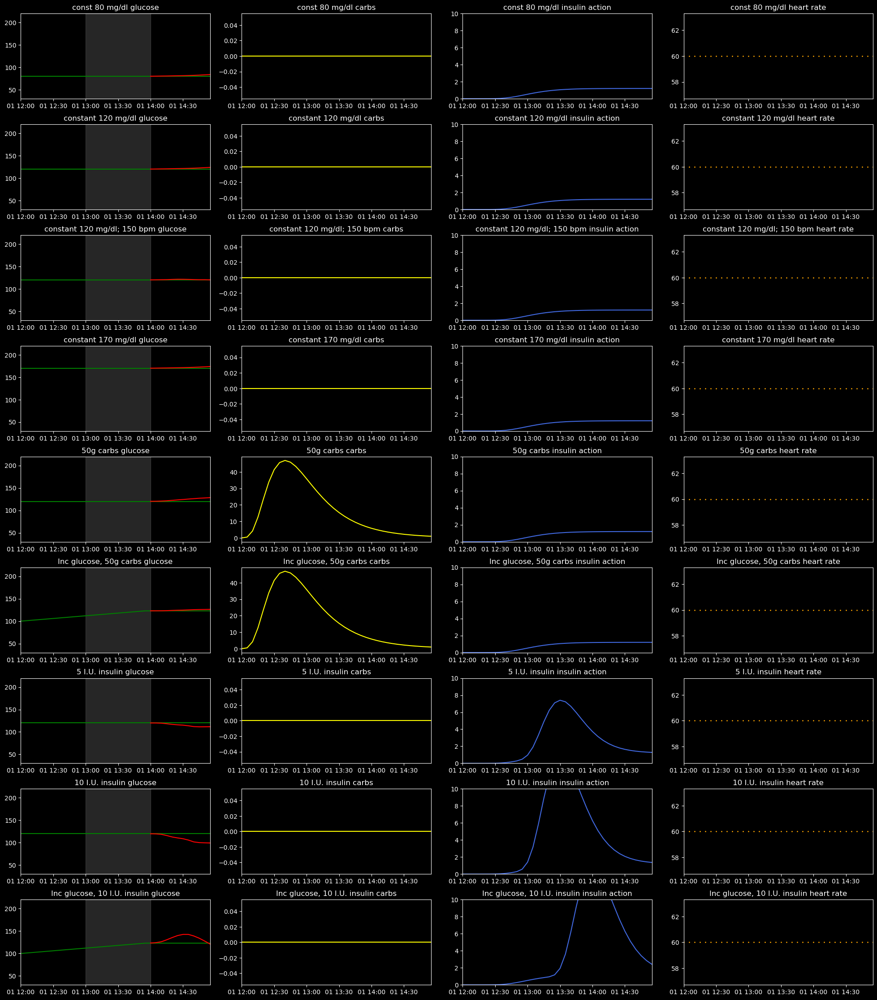

In [61]:
#@title Artificial Scenarios
m.test_data = []

def create_static_data(self, name, glucose, basal, carb_events, insulin_events, hr=60.0, hr_long=0.0):
  row_count = len(self.PERIOD_MINUTES)
  if np.isscalar(glucose): glucose = row_count * [glucose]
  if np.isscalar(basal): basal = row_count * [basal]
  glucose_range=(30, 180)
  df = pd.DataFrame({
      'date': pd.date_range('2023-11-01T12:00Z', periods=row_count, freq=self.FREQ),
      'glucose': map(float, glucose),
      'basal': basal })
  df['hour'] = df.date.map(lambda ts: ts.astimezone('CET').hour)
  print('HH %s' % str(df['hour']))

  d, v = zip(*carb_events) if carb_events else ([], [])
  carbs = pd.DataFrame({ 'date': d, 'carbs': v})
  d, v = zip(*insulin_events) if insulin_events else ([], [])
  insulin = pd.DataFrame({ 'date': d, 'bolus': v })

  df['gl_slope'] = slope_series(df.glucose, df.date, timedelta(minutes=1)).fillna(0.0)
  df['gl_slop2'] = slope_series(df.gl_slope, df.date, timedelta(minutes=1)).fillna(0.0)
  df['ia1'] = (
      np.array(self.INSULIN_ACTION.values_at(
          insulin.date.values, insulin.bolus.values, df.date.values)))
  df['ia2'] = (
      np.array(self.INSULIN_ACTION.values_at(
          df.date.values, df.basal.values, df.date.values)))
  df['ia'] = df.ia1 + df.ia2
  df.pop('ia1')
  df.pop('ia2')
  df['ca'] = np.array(self.CARB_ACTION.values_at(
      carbs['date'].values, carbs['carbs'].values, df['date'].values))
  df['heart_rate'] = np.array(row_count * [hr])
  df['hr_long'] = np.array(row_count * [hr_long])
  df['hr_lon2'] = np.array(row_count * [hr_long])
  df['minute'] = ((df['date'] - df['date'][0]) / timedelta(minutes=1)).astype(int)

  df.set_index('date', inplace=True)
  df['carbs'] = carbs.carbs
  df.carbs.fillna(0.0, inplace=True)
  df['bolus'] = insulin.bolus
  df.bolus.fillna(0.0, inplace=True)

  p = self.add_prediction(df)
  inputVector = self.x_data_conv(self.pivot_for_model(df)).values[0].tolist()
  #inputVector[0] += 1  # +1h for tz (UTC -> CET)

  df.reset_index(inplace=True)
  to_dv = lambda dv: {'timestamp': str(dv[0]), 'value': dv[1] }
  map_dv = lambda dvs: list(map(to_dv, dvs))

  self.test_data.append({'at': str(df['date'][0])})
  self.test_data[-1]['name'] = name
  self.test_data[-1]['basal'] = map_dv(sorted(list(zip(map(str, df.date), 12*df.basal))))
  self.test_data[-1]['inputData'] = df.drop(['date'], axis=1).to_dict(orient='list')
  self.test_data[-1]['inputVector'] = inputVector
  self.test_data[-1]['insulinEvents'] = map_dv(insulin_events)
  self.test_data[-1]['carbEvents'] = map_dv(carb_events)
  self.test_data[-1]['heartRates'] = row_count * [hr]
  self.test_data[-1]['hrLongCounts'] = 2 * [hr_long]
  self.test_data[-1]['outputSlopes'] = p.gl_slope.tolist()
  self.test_data[-1]['outputGlucose'] = p.glucose.tolist()

  df.set_index('date', inplace=True)
  return (name, df)
M.create_static_data = create_static_data
del create_static_data

inc_glucose = list(list(range(100, 100 + len(m.PERIOD_X_MINUTES))) + (len(m.PERIOD_Y_MINUTES) * [123]))

gics = [
    m.create_static_data('const 80 mg/dl', 80, 0.1, [], []),
    m.create_static_data('constant 120 mg/dl', 120, 0.1, [], []),
    m.create_static_data('constant 120 mg/dl; 150 bpm', 120, 0.1, [], [], hr_long=100),
    m.create_static_data('constant 170 mg/dl', 170, 0.1, [], []),
    m.create_static_data('50g carbs', 120, 0.1, [(pd.to_datetime('2023-11-01T11:55Z'), 50)], []),
    m.create_static_data('Inc glucose, 50g carbs', inc_glucose, 0.1, [(pd.to_datetime('2023-11-01T11:55Z'), 50)], []),
    m.create_static_data('5 I.U. insulin', 120, 0.1, [], [(pd.to_datetime('2023-11-01T12:30Z'), 5)]),
    m.create_static_data('10 I.U. insulin', 120, 0.1, [], [(pd.to_datetime('2023-11-01T12:30Z'), 10)]),
    m.create_static_data(
        'Inc glucose, 10 I.U. insulin',
        inc_glucose,
        0.1,
         [],
         [(pd.to_datetime('2023-11-01T13:00Z'), 10)]),
]


# gics[0][1]
fig, axs = plt.subplots(nrows=len(gics), ncols=4, subplot_kw={}, figsize=(20, 2.5 * len(gics)))
fig.tight_layout(pad=2.0)

for ax, ndf in zip(axs, gics):
  n, df = ndf
  print('plot ' + n)
  plot_timeline(ax, df, title=n)



# Write Model

In [62]:
#@title Write Model

def write_model(self, model=None):
  if model is None: model = self.model
  self.write_meta_json(os.path.join(CACHE_DIR, 'glucose_model.json'))
  converter = tf.lite.TFLiteConverter.from_keras_model(model)
  converter.inference_input_type = tf.float32
  tflite_model_bytes = converter.convert()
  tflite_model = tf.lite.Interpreter(model_content=tflite_model_bytes)
  tflite_model_path = os.path.join(CACHE_DIR, 'glucose_model.tflite')
  with open(tflite_model_path, 'wb') as f:
    f.write(tflite_model_bytes)
M.write_model = write_model
del write_model
m.write_model()



2024-02-06 15:45:06.257123: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,?,5]
	 [[{{node inputs}}]]
2024-02-06 15:45:06.304393: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Input' with dtype float and shape [?,183]
	 [[{{node Input}}]]
2024-02-06 15:45:06.321628: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Input' with dtype float and shape [?,183]
	 [[{{node Input}}]]
2024-02-06 15:45:06.

INFO:tensorflow:Assets written to: /var/folders/98/yh978f1j4zq_ps8kx_9_wmy00000gn/T/tmpkb8n5qkg/assets


INFO:tensorflow:Assets written to: /var/folders/98/yh978f1j4zq_ps8kx_9_wmy00000gn/T/tmpkb8n5qkg/assets
2024-02-06 15:45:06.764772: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'serving_default_Input' with dtype float and shape [?,183]
	 [[{{node serving_default_Input}}]]
2024-02-06 15:45:06.947796: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:364] Ignored output_format.
2024-02-06 15:45:06.947809: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:367] Ignored drop_control_dependency.
2024-02-06 15:45:06.947967: I tensorflow/cc/saved_model/reader.cc:45] Reading SavedModel from: /var/folders/98/yh978f1j4zq_ps8kx_9_wmy00000gn/T/tmpkb8n5qkg
2024-02-06 15:45:06.949380: I tensorflow/cc/saved_model/reader.cc:89] Reading meta graph with tags { serve }
2024-02-06 15:45